In [1]:
# from google.colab import drive
# drive.mount('/content/drive')
# proj_dir = "/content/drive/MyDrive/cs180_proj5_nerf/"
import os
import tqdm


proj_dir = './'
model_dir = proj_dir + 'models/'
inp_dir = proj_dir + 'input/'
log_dir = proj_dir + 'part1_logdir'
os.makedirs(proj_dir, exist_ok=True)
os.makedirs(model_dir, exist_ok=True)

In [2]:
import matplotlib.pyplot as plt
from torch.utils.data import Dataset
from torchvision import datasets, transforms
from torch.utils.data import DataLoader
from PIL import Image

In [3]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import math
import numpy as np
import random

device = 'cuda' if torch.cuda.is_available() else 'cpu'
if torch.backends.mps.is_available():
    device = 'mps'
print(device)

mps


In [4]:
def to_torch(*args, **kwargs):
    return torch.from_numpy(*args, **kwargs).float().to(device)

def to_numpy(tensor):
    return tensor.to('cpu').detach().numpy()

In [5]:
import random
def set_seed(seed=1):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    torch.cuda.manual_seed(seed)
    torch.backends.cudnn.benchmark = False
    torch.backends.cudnn.deterministic = True
set_seed(1)

# Part 1: Fit a Neural Field to a 2D Image
## Model

In [29]:
class BasicNerfMlp(nn.Module):
  def __init__(self, img, L=10, lr=0.01, complex=False):
    super(BasicNerfMlp, self).__init__()
    self.L = L
    self.pos_enc_dim = 2 + (self.L) * 2 * 2 # sin/cos, and x,y, and original 2
    self.out_dim = 3 # Output rgb
    self.model = self.build_mlp_model_simple() if not complex else self.build_mlp_model_complex()
    self.loss = nn.MSELoss()
    self.optimizer = torch.optim.Adam(self.model.parameters(), lr=lr)
    freq_levels = torch.arange(0, self.L, dtype=torch.float32, device=device)
    self.exp_frequencies = torch.pow(2,freq_levels).unsqueeze(0)
    h, w = img.shape[:2]
    self.img_h = h
    self.img_w = w
    assert (self.img_h > 3) and (self.img_w > 3)

  def build_mlp_model_simple(self):
    return nn.Sequential(
        nn.Linear(self.pos_enc_dim, 256),
        nn.ReLU(),
        nn.Linear(256, 256),
        nn.ReLU(),
        nn.Linear(256, 256),
        nn.ReLU(),
        nn.Linear(256, self.out_dim),
        nn.Sigmoid()
    )
  def build_mlp_model_complex(self):
    return nn.Sequential(
        nn.Linear(self.pos_enc_dim, 256),
        nn.ReLU(),
        nn.Linear(256, 256),
        nn.ReLU(),
        nn.Linear(256, 256),
        nn.ReLU(),
        nn.Linear(256, 256),
        nn.ReLU(),
        nn.Linear(256, self.out_dim),
        nn.Sigmoid()
    )

  # Creates pos enc of the form
  # x,y, sin(2^0*x) sin(2^1*x) ..., sin(2^0*y) sin(2^1*y) ...,
  # cos(2^0*x) cos(2^1*x) ..., cos(2^0*y) cos(2^1*y) ...
  def sin_pos_encoding(self, x):
    if x.ndim == 1:
      x = x.unsqueeze(0)
    x = x.unsqueeze(-1) # add third dim
    batch_size = x.shape[0]
    pos_matrix = torch.matmul(x, self.exp_frequencies) * math.pi
    pos_matrix = pos_matrix.reshape(batch_size, 2*self.L)

    # x = x.squeeze(-1)
    stacked_pos_enc = torch.hstack((x.squeeze(-1), torch.sin(pos_matrix), torch.cos(pos_matrix)))

    assert stacked_pos_enc.shape == (batch_size, self.pos_enc_dim)
    return stacked_pos_enc

  def forward(self, x):
    xorm = torch.zeros_like(x, dtype=torch.float32, device=device)
    xorm[:, 0] = torch.div(x[:, 0], self.img_h).to(torch.float32)
    xorm[:, 1] = torch.div(x[:, 1], self.img_w).to(torch.float32)
    # x = (x / 255) # Normalize from [0,255] to [0,1]
    pos_enc = self.sin_pos_encoding(xorm)
    output = self.model(pos_enc)
    return output

In [9]:
net = BasicNerfMlp(img=torch.rand((689,1024,3)), L=4)
net = net.to(device)
x = torch.tensor([[3,4],
                  [4,5]], dtype=torch.float32, device=device)
pos = net.sin_pos_encoding(x)
# net(x)

In [10]:
#Check embedding code
assert(pos[0, 0] == 3)
assert(pos[0,1] == 4)
epsilon = 1e-5
assert(pos[0,2] - math.sin(math.pi*3*2**0) < epsilon)
assert(pos[0,3] - (math.pi*3*2**1) < epsilon)
assert(pos[0,4] - (math.pi*3*2**2) < epsilon)

## Datasets and Data Loaders

torch.Size([3, 689, 1024])


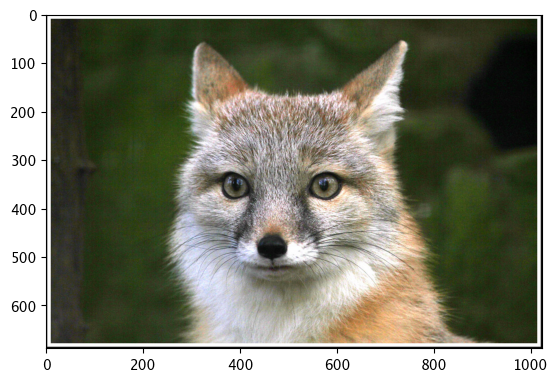

In [11]:
transform = transforms.Compose([
  transforms.PILToTensor()
])
fox_img_path = inp_dir + '/fox_img.jpg'
fox_img = transform(Image.open(fox_img_path))
print(fox_img.shape)
fox_img = fox_img.moveaxis(0, -1)
plt.imshow(fox_img)

torch.Size([3, 1311, 1200])


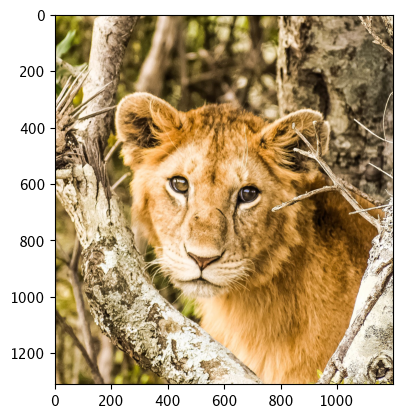

In [12]:
transform = transforms.Compose([
  transforms.PILToTensor()
])
lion_img_path = inp_dir + '/lion.jpeg'
lion_img = transform(Image.open(lion_img_path))
print(lion_img.shape)
lion_img = lion_img.moveaxis(0, -1)
plt.imshow(lion_img)

In [13]:
class SingleImgDataset(Dataset):
  def __init__(self, img_path: str, batch_size=10000, shuffle=True):
    self.img_path = img_path
    self.img = self.load_image().to(device).moveaxis(0,-1)
    # self.img = self.img.pin_memory()
    self.height = self.img.shape[0]
    self.width = self.img.shape[1]
    self.num_pixels = self.height * self.width
    self.batch_size = batch_size
    self.shuffle = shuffle
    self.cur_pos = 0

  def load_image(self):
    transform = transforms.Compose([
      transforms.PILToTensor()
    ])
    return transform(Image.open(self.img_path)).to(torch.float32)/255

  def __getitem__(self, index: int):
    if self.shuffle:
      pixels = torch.randint(0, self.num_pixels, (self.batch_size,1)).to(device)
    else:
      end_pixel = min(self.num_pixels, self.cur_pos+self.batch_size)
      act_batch_size = end_pixel - self.cur_pos
      pixels = torch.arange(self.cur_pos, end_pixel,
                            device=device).reshape(act_batch_size,1)
      self.cur_pos += act_batch_size
      if self.cur_pos >= self.num_pixels: self.cur_pos=0
    h = torch.div(pixels, self.width, rounding_mode='floor')
    w = pixels - h * self.width
    rgb_tensor = self.img[h, w].squeeze(1) # label
    # h = torch.div(h, self.height).to(torch.float32)
    # w = torch.div(w, self.width).to(torch.float32)
    inp_tensor = torch.cat([h, w], dim=-1)
    # inp_tensor = torch.tensor([h,w], dtype=torch.float32)/255 # Normalize label
    return inp_tensor, rgb_tensor

  def __len__(self) -> int:
    return math.ceil(self.num_pixels/self.batch_size)

In [14]:
from torch.utils.data import RandomSampler

batch_size = 10000
fox_data = SingleImgDataset(fox_img_path,batch_size=batch_size)
# sampler = RandomSampler(fox_data, replacement=True)
train_loader = DataLoader(SingleImgDataset(fox_img_path, batch_size=batch_size, shuffle=True))
test_loader = DataLoader(SingleImgDataset(fox_img_path, batch_size=batch_size, shuffle=False))
img = fox_data.img
img_pred = torch.zeros_like(img, device=device)
img_pred = img_pred.moveaxis(-1, 0)

#### Varying LR

In [ ]:
from torch.utils.tensorboard import SummaryWriter
import time

# This moves the network to GPU.
# device='mps'
img_pred = torch.zeros((3,689,1024)).to(device)
print(device)
for _, lr in enumerate(tqdm.tqdm([0.00125, 0.0025, 0.005, 0.01, 0.02, 0.04, 0.08])):
    model = BasicNerfMlp(img=fox_img, lr=lr).to(device)
    logfile =  "log_" + time.strftime("%d-%m-%Y_%H-%M-%S") + '_lr=' + str(lr)
    logdir = os.path.join(log_dir, logfile)
    print(logdir)
    if not (os.path.exists(logdir)):
        os.makedirs(logdir)

    tb_writer = SummaryWriter(log_dir=logdir)

    num_batch = len(test_loader)
    total_train_iter = 3000
    epoch = 0
    num_iter = 0
    while num_iter < total_train_iter:
        # Wrap in a progress bar to display progress during training.
        for i, data in enumerate(train_loader):
            inputs, labels = data
            # print((inputs*255)[:5,:])

            # We need to put our data on the GPU too.
            inputs = inputs.squeeze(0) # kill batchdim from dataloader
            labels = labels.squeeze(0)
            inputs = inputs.to(device)
            labels = labels.to(device)
            model.optimizer.zero_grad()
            outputs = model(inputs)
            loss = model.loss(outputs, labels)
            loss.backward()
            model.optimizer.step()

            # Now use tensorboard for logging, as well as progress bar.
            num_iter += 1
            tb_writer.add_scalar("loss", loss.detach().item(), num_iter)

            # progress_bar.set_description(f"Loss: {loss}")
        epoch += 1
        img_pred *= 0
        psnr = 0
        with torch.no_grad():
            for _, data in enumerate(test_loader):
                inputs, labels = data
                inputs = inputs.squeeze(0) # kill batchdim from dataloader
                labels = labels.squeeze(0)
                inputs = inputs.to(device)
                labels = labels.to(device)
                outputs = model(inputs)

                inp_h = (inputs[:, 0]).to(int)
                inp_w = (inputs[:, 1]).to(int)

                img_pred[:, inp_h, inp_w] = outputs.moveaxis(0,-1)
                loss = model.loss(outputs, labels).detach().item()

                psnr += -10*math.log10(loss)

        psnr /= num_batch
        tb_writer.add_scalar("PSNR", psnr, num_iter)
        tb_writer.add_image('Predicted img', img_pred, num_iter)
    torch.save(model.state_dict(), os.path.join(model_dir, 'checkpoint_default_lr_' + str(lr) + '.pt'))
    print('Finished Training')

#### Varing L

In [ ]:
from torch.utils.tensorboard import SummaryWriter
import time

# This moves the network to GPU.
# device='mps'
img_pred = torch.zeros((3,689,1024)).to(device)
print(device)
for L in [1,4,7,10,13,16,20,25,30]:
    model = BasicNerfMlp(img=fox_img, L=L).to(device)
    logfile =  "log_" + time.strftime("%d-%m-%Y_%H-%M-%S") + '_L=' + str(L)
    logdir = os.path.join(log_dir, logfile)
    print(logdir)
    if not (os.path.exists(logdir)):
        os.makedirs(logdir)

    tb_writer = SummaryWriter(log_dir=logdir)

    num_batch = len(test_loader)
    total_train_iter = 3000
    epoch = 0
    num_iter = 0
    while num_iter < total_train_iter:
        # Wrap in a progress bar to display progress during training.
        progress_bar = tqdm.tqdm(train_loader)

        for i, data in enumerate(progress_bar):
            inputs, labels = data
            # print((inputs*255)[:5,:])

            # We need to put our data on the GPU too.
            inputs = inputs.squeeze(0) # kill batchdim from dataloader
            labels = labels.squeeze(0)
            inputs = inputs.to(device)
            labels = labels.to(device)
            model.optimizer.zero_grad()
            outputs = model(inputs)
            loss = model.loss(outputs, labels)
            loss.backward()
            model.optimizer.step()

            # Now use tensorboard for logging, as well as progress bar.
            num_iter += 1
            tb_writer.add_scalar("loss", loss.detach().item(), num_iter)

            progress_bar.set_description(f"Loss: {loss}")
        epoch += 1
        img_pred *= 0
        psnr = 0
        with torch.no_grad():
            for _, data in enumerate(tqdm.tqdm(test_loader)):
                inputs, labels = data
                inputs = inputs.squeeze(0) # kill batchdim from dataloader
                labels = labels.squeeze(0)
                inputs = inputs.to(device)
                labels = labels.to(device)
                outputs = model(inputs)

                inp_h = (inputs[:, 0]).to(int)
                inp_w = (inputs[:, 1]).to(int)

                img_pred[:, inp_h, inp_w] = outputs.moveaxis(0,-1)
                loss = model.loss(outputs, labels).detach().item()

                psnr += -10*math.log10(loss)

        psnr /= num_batch
        tb_writer.add_scalar("PSNR", psnr, num_iter)
        tb_writer.add_image('Predicted img', img_pred, num_iter)
    torch.save(model.state_dict(), os.path.join(model_dir, 'checkpoint_default_L_' + str(L) + '.pt'))
    print('Finished Training')

#### Final Model
##### Fox

In [ ]:
from torch.utils.tensorboard import SummaryWriter
import time

# This moves the network to GPU.
# device='mps'
img_pred = torch.zeros((3,689,1024)).to(device)
print(device)

model = BasicNerfMlp(img=fox_img, L=16, lr=0.005).to(device)
logfile =  "log_" + time.strftime("%d-%m-%Y_%H-%M-%S") + '_L=' + str(16)+ '_lr=' + '0.005'
logdir = os.path.join(log_dir, logfile)
print(logdir)
if not (os.path.exists(logdir)):
    os.makedirs(logdir)

tb_writer = SummaryWriter(log_dir=logdir)

num_batch = len(test_loader)
total_train_iter = 3000
epoch = 0
num_iter = 0
while num_iter < total_train_iter:
    # Wrap in a progress bar to display progress during training.
    progress_bar = tqdm.tqdm(train_loader)

    for i, data in enumerate(progress_bar):
        inputs, labels = data
        # print((inputs*255)[:5,:])

        # We need to put our data on the GPU too.
        inputs = inputs.squeeze(0) # kill batchdim from dataloader
        labels = labels.squeeze(0)
        inputs = inputs.to(device)
        labels = labels.to(device)
        model.optimizer.zero_grad()
        outputs = model(inputs)
        loss = model.loss(outputs, labels)
        loss.backward()
        model.optimizer.step()

        # Now use tensorboard for logging, as well as progress bar.
        num_iter += 1
        tb_writer.add_scalar("loss", loss.detach().item(), num_iter)

        progress_bar.set_description(f"Loss: {loss}")
    epoch += 1
    img_pred *= 0
    psnr = 0
    with torch.no_grad():
        for _, data in enumerate(tqdm.tqdm(test_loader)):
            inputs, labels = data
            inputs = inputs.squeeze(0) # kill batchdim from dataloader
            labels = labels.squeeze(0)
            inputs = inputs.to(device)
            labels = labels.to(device)
            outputs = model(inputs)

            inp_h = (inputs[:, 0]).to(int)
            inp_w = (inputs[:, 1]).to(int)

            img_pred[:, inp_h, inp_w] = outputs.moveaxis(0,-1)
            loss = model.loss(outputs, labels).detach().item()

            psnr += -10*math.log10(loss)

    psnr /= num_batch
    tb_writer.add_scalar("PSNR", psnr, num_iter)
    tb_writer.add_image('Predicted img', img_pred, num_iter)
    
torch.save(model.state_dict(), os.path.join(model_dir, 'checkpoint_final.pt'))
print('Finished Training')

##### Lion

In [ ]:
batch_size = 10000
lion_data = SingleImgDataset(lion_img_path,batch_size=batch_size)
# sampler = RandomSampler(fox_data, replacement=True)
train_loader = DataLoader(SingleImgDataset(lion_img_path, batch_size=batch_size, shuffle=True))
test_loader = DataLoader(SingleImgDataset(lion_img_path, batch_size=batch_size, shuffle=False))
img = lion_data.img
img_pred = torch.zeros_like(img, device=device)
img_pred = img_pred.moveaxis(-1, 0)

# This moves the network to GPU.
# device='mps'
print(device)
lr=0.0025
L=40
model = BasicNerfMlp(img=lion_img, L=L, lr=lr, complex=True).to(device)
logfile =  "lion_c_log_" + time.strftime("%d-%m-%Y_%H-%M-%S") + '_L=' + str(L)+ '_lr=' + str(lr)
logdir = os.path.join(log_dir, logfile)
print(logdir)
if not (os.path.exists(logdir)):
    os.makedirs(logdir)

tb_writer = SummaryWriter(log_dir=logdir)

num_batch = len(test_loader)
total_train_iter = 10000
epoch = 0
num_iter = 0
while num_iter < total_train_iter:
    # Wrap in a progress bar to display progress during training.
    progress_bar = tqdm.tqdm(train_loader)

    for i, data in enumerate(progress_bar):
        inputs, labels = data
        # print((inputs*255)[:5,:])

        # We need to put our data on the GPU too.
        inputs = inputs.squeeze(0) # kill batchdim from dataloader
        labels = labels.squeeze(0)
        inputs = inputs.to(device)
        labels = labels.to(device)
        model.optimizer.zero_grad()
        outputs = model(inputs)
        loss = model.loss(outputs, labels)
        loss.backward()
        model.optimizer.step()

        # Now use tensorboard for logging, as well as progress bar.
        num_iter += 1
        tb_writer.add_scalar("loss", loss.detach().item(), num_iter)

        progress_bar.set_description(f"Loss: {loss}")
    epoch += 1
    img_pred *= 0
    psnr = 0
    with torch.no_grad():
        for _, data in enumerate(tqdm.tqdm(test_loader)):
            inputs, labels = data
            inputs = inputs.squeeze(0) # kill batchdim from dataloader
            labels = labels.squeeze(0)
            inputs = inputs.to(device)
            labels = labels.to(device)
            outputs = model(inputs)

            inp_h = (inputs[:, 0]).to(int)
            inp_w = (inputs[:, 1]).to(int)

            img_pred[:, inp_h, inp_w] = outputs.moveaxis(0,-1)
            loss = model.loss(outputs, labels).detach().item()

            psnr += -10*math.log10(loss)

    psnr /= num_batch
    tb_writer.add_scalar("PSNR", psnr, num_iter)
    tb_writer.add_image('Predicted img', img_pred, num_iter)
    
torch.save(model.state_dict(), os.path.join(model_dir, 'checkpoint_final_lion.pt'))
print('Finished Training')

In [ ]:
torch.save(model.state_dict(), os.path.join(model_dir, 'checkpoint_default.pt'))

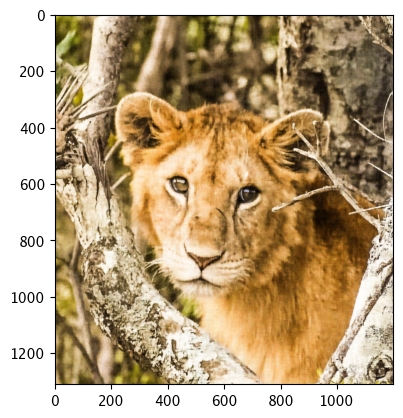

In [36]:
plt.imshow(img_pred.detach().cpu().moveaxis(0,-1))

In [45]:
import tensorflow as tf
from PIL import Image
import torchvision
import torchvision.transforms as T
# Path to the event file


# Path to the output directory
out_dir = proj_dir + '/out_dir/'
output_dir = out_dir +'/part_1/fox/'
os.makedirs(output_dir, exist_ok=True)

trans = T.ToPILImage()

def save_tb_img(fname, img_out, out_dir=output_dir):
    full_name = out_dir + '/' + fname
    # im = trans(img_out)
    im = Image.fromarray(img_out)
    im.save(full_name)
    # plt.imsave(img_out, full_name)
    # img_out.save(full_name)

def extract_tensorboard_scalars(event_file_path, keys):
    freq = [158, 316, 158*3, 158*4, 158*5]
    # freq = [71, 142, 213, 426, 994, 3053]
    # Create a summary iterator
    event_iterator = tf.compat.v1.train.summary_iterator(event_file_path)

    # Loop through events
    for event in event_iterator:
        # print(event.step)
        if event.WhichOneof('what') == 'summary' and event.step in freq:
            for value in event.summary.value:
                if value.tag in keys and value.HasField('image'):
                    image_data_enc = value.image.encoded_image_string
                    image_name = f"{value.tag}_{event.step}.png"
                    image_path = os.path.join(output_dir, image_name)

                    # Decode and save the image
                    image = tf.image.decode_image(image_data_enc).numpy()
                    save_tb_img(image_name, image, out_dir=output_dir)
# ef = 'part1_logdir/log_15-11-2023_18-59-44_L=16/events.out.tfevents.1700103584.Aayushs-MacBook-Pro.local.18407.23'
ef = 'part1_logdir/lion_c_log_15-11-2023_20-25-33_L=40_lr=0.0025/events.out.tfevents.1700108733.Aayushs-MacBook-Pro.local.22157.18'
extract_tensorboard_scalars(ef, ['Predicted img'])

# Part 2

In [6]:
class RawData:
    def __init__(self, path=inp_dir+"lego_200x200.npz") -> None:
        self.data = np.load(path)
        self.load_data()

    def load_data(self):
        # Training images: [100, 200, 200, 3]
        self.images_train = (self.data["images_train"] / 255.0)
        self.height, self.width = 200, 200
        # Cameras for the training images
        # (camera-to-world transformation matrix): [100, 4, 4]
        self.c2ws_train = self.data["c2ws_train"]

        # Validation images:
        self.images_val = self.data["images_val"] / 255.0

        # Cameras for the validation images: [10, 4, 4]
        # (camera-to-world transformation matrix): [10, 200, 200, 3]
        self.c2ws_val = self.data["c2ws_val"]

        # Test cameras for novel-view video rendering:
        # (camera-to-world transformation matrix): [60, 4, 4]
        self.c2ws_test = self.data["c2ws_test"]

        # Camera focal length
        self.focal = self.data["focal"]  # float
        self.fx = self.fy = to_torch(self.focal)
        self.K = torch.tensor([[self.fx, 0, 200/2], [0, self.fy, 200/2], [0, 0, 1]])
# rd = RawData()

In [7]:
data = np.load(inp_dir + "lego_200x200.npz")

# Training images: [100, 200, 200, 3]
images_train = data["images_train"] / 255.0

# Cameras for the training images
# (camera-to-world transformation matrix): [100, 4, 4]
c2ws_train = data["c2ws_train"]

# Validation images:

images_val = data["images_val"] / 255.0 # [10, 200, 200, 3]

# (camera-to-world transformation matrix):
# Cameras for the validation images: [10, 4, 4]
c2ws_val = data["c2ws_val"]

# Test cameras for novel-view video rendering:
# (camera-to-world transformation matrix): [60, 4, 4]
c2ws_test = data["c2ws_test"]

# Camera focal length
focal = data["focal"]  # float

In [8]:
# Applied matrix multiplication to transform coords
# by a homogenous transformation. Takes in 3D (non-homogenous)
# points
def transform(trans, c):
    assert trans.dim() == (c.dim() + 1)
    no_batch = False

    if trans.dim() != 3:
        trans = trans.unsqueeze(0)
        no_batch = True
        c = c.unsqueeze(0)

    c_hom = torch.hstack((c, torch.ones(c.shape[0],1, device=device)))
    transformed = torch.matmul(trans, c_hom[..., None]).squeeze(-1)[:,:-1]

    if no_batch:
        transformed = transformed.squeeze(0)
    return transformed

In [9]:
# Tranforms from camera to pixel frame
def camera_to_pixel(K, x_c):
    assert K.dim() == (x_c.dim() + 1)

    no_batch = False
    if K.dim() != 3:
        K, x_c = K.unsqueeze(0), x_c.unsqueeze(0)
        no_batch = True
    transformed = torch.matmul(K, x_c[..., None]).squeeze(-1)[:,:-1] / x_c[:,-1].unsqueeze(-1)
    if no_batch:
        transformed = transformed.squeeze(0)
    return transformed

# Tranforms from pixel to camera frame, scaling the depth to be s=z_c
def pixel_to_camera(K, uv, s):
    # assert K.dim() == (uv.dim() + 1)
    no_batch = False
    if K.dim() != 3:
        K, uv = K.unsqueeze(0), uv.unsqueeze(0)
        no_batch = True
    # Reshape from [a,b,c] to [[a],[b],[c]]
    if not isinstance(s, int) and s.dim() == 1:
        s = s.unsqueeze(-1)

    scaled = torch.hstack((uv, torch.ones(uv.shape[0],1, device=device))) * s
    X_c = torch.matmul(torch.inverse(K), scaled[..., None]).squeeze(-1)

    if no_batch:
       X_c = X_c.squeeze(0)
    return X_c

In [10]:
# Converts a pixel coord to a ray with origin and normalized
# direction.
def pixel_to_ray(K, c2w, uv):
    no_batch = False
    K, c2w, uv = K, c2w, uv
    if K.dim() != 3:
        K, c2w, uv = K.unsqueeze(0), c2w.unsqueeze(0), uv.unsqueeze(0)
        no_batch = True

    X_c = pixel_to_camera(K, uv, s=1)
    X_w = transform(c2w, X_c)
    # r_o = torch.matmul(torch.transpose(-c2w[:,:-1,:-1], dim0=1, dim1=2), c2w[:,:-1,3, None]).squeeze(-1)
    r_o = c2w[:,:3,3]

    r_d = (X_w - r_o)
    r_d = torch.div(r_d, torch.linalg.vector_norm(r_d, dim=1).unsqueeze(-1))

    if no_batch:
        r_o, r_d = r_o.squeeze(0), r_d.squeeze(0)
    return r_o, r_d

# Part 2.2 Sampling
### Sampling rays from Images

In [11]:
# Samples num_rays rays total from all images,
# performing a global random sampling from the flattened images.

set_seed(1)
def sample_rays(images, K, c2w_all, num_rays):
    num_images, img_height, img_width = images.shape[:-1]
    # num_images_to_sample = min(20, num_images)
    # num_samples_per_img = num_rays // num_images_to_sample
    images_flat = torch.flatten(images, end_dim=-2) # don't flatten channels

    num_pixels_per_img = torch.numel(images[0])
    num_total_pixels = torch.numel(images_flat)

    # Global pixel indices over all flattened images
    sampled_pixels_idx = torch.randint(0, num_total_pixels, (num_rays,)).to(device)

    # Each elem gives the image to which the pixel corresponds
    sampled_pixels_idx_to_img = torch.floor_divide(sampled_pixels_idx, num_pixels_per_img)

    # The relative pixel number
    actual_pixel_idx = sampled_pixels_idx - sampled_pixels_idx_to_img * num_pixels_per_img

    h = torch.div(actual_pixel_idx, img_width, rounding_mode='floor')
    w = actual_pixel_idx - h * img_width

    rgb_pixel_vals = images_flat[sampled_pixels_idx] # B x 3
    assert rgb_pixel_vals.shape == (num_rays, 3)

    uv = torch.cat([w.unsqueeze(-1), h.unsqueeze(-1)], dim=-1) + 0.5 # B x 2 (account for the offset)
    assert uv.shape == (num_rays, 2) # uv is widths/heights (x,y)

    rays_o, rays_d = pixel_to_ray(
        K,
        c2w_all[sampled_pixels_idx_to_img],
        uv
    )
    assert rays_o.shape == (num_rays, 3)
    assert rays_d.shape == (num_rays, 3)

    return rays_o, rays_d, rgb_pixel_vals

### Sampling Points along Rays

In [12]:
def sample_along_rays(rays_o, rays_d, perturb=True, n_samples=64):
    far, near = 6.0, 2.0
    t_width = (far-near) / n_samples

    t = torch.linspace(start=near, end=far, steps=n_samples, device=device)
    if perturb:
        t = t + (torch.rand(t.shape, device=device) * t_width)

    # print((rays_d * t.view(n_samples, 1, 1)).shape, rays_o.shape)
    x = rays_o + rays_d * t.view(n_samples, 1, 1)
    return x.moveaxis(0,1), t

# Part 2.3: Putting the Dataloading All Together

In [13]:
class RaysData:
  def __init__(self, images, K, c2ws, train=True, batch_size=10000):

    self.c2ws = torch.from_numpy(c2ws).to(torch.float32).to(device)

    self.K = K.to(torch.float32).unsqueeze(0).to(device)
    self.train = train

    self.num_images, self.img_height, self.img_width = images.shape[:-1]
    self.pixels = torch.flatten(to_torch(images), end_dim=-2) # don't flatten channels

    self.num_pixels_per_img = self.img_height * self.img_width
    self.num_total_pixels = self.num_pixels_per_img * self.num_images

    self.batch_size = batch_size
    self.num_batch_per_img = int(self.num_pixels_per_img/self.batch_size)
    # self.cur_pos = 0 # only for validation/test

    all_pix = torch.arange(0, self.num_pixels_per_img, device=device)
    h = torch.div(all_pix, self.img_width, rounding_mode='floor')
    w = all_pix - h * self.img_width
    self.uvs = torch.cat([w.unsqueeze(-1), h.unsqueeze(-1)], dim=-1) # 40000 x 2 (account for the offset)

    indices = torch.arange(end=self.num_images).expand((40000,self.num_images)).moveaxis(0,-1).flatten()
    self.rays_o, self.rays_d = pixel_to_ray(
        self.K,
        self.c2ws[indices],
        self.uvs.repeat(self.num_images, 1) + 0.5
    )
    # self.rays_o, self.rays_d = self.rays_o.pin_memory(), self.rays_d.pin_memory()

  def sample_rays(self, num_rays=10000, img_num=None, batch_num=None):
    # Global pixel indices over all flattened images
    if self.train:
      sampled_pixels_idx = torch.randint(0, self.num_total_pixels, (num_rays,), device=device)
    else:
      start = img_num * self.num_pixels_per_img + batch_num*self.batch_size
      sampled_pixels_idx = torch.arange(start, start+num_rays, device=device)

    rgb_pixel_vals = self.pixels[sampled_pixels_idx] # B x 3
    rays_o, rays_d = self.rays_o[sampled_pixels_idx], self.rays_d[sampled_pixels_idx]

    return rays_o, rays_d, rgb_pixel_vals

  def sample_img(self, img_num, batch_num):
    return self.sample_rays(self.batch_size, img_num, batch_num)

  def __getitem__(self, index: int):
    return self.sample_rays(self.batch_size)

  def __len__(self) -> int:
    return math.ceil(self.num_total_pixels/self.batch_size)

In [14]:
class RaysTestSampler:
  def __init__(self, K, c2ws, batch_size=10000, width=200, height=200):

    self.c2ws = torch.from_numpy(c2ws).to(torch.float32).to(device)
    self.K = K.to(torch.float32).unsqueeze(0).to(device)

    self.num_views, self.img_height, self.img_width = self.c2ws.shape[0], height, width

    self.num_pixels_per_img = self.img_height * self.img_width
    self.num_total_pixels = self.num_pixels_per_img * self.num_views

    self.batch_size = batch_size
    self.num_batch_per_img = int(self.num_pixels_per_img/self.batch_size)

    all_pix = torch.arange(0, self.num_pixels_per_img, device=device)
    h = torch.div(all_pix, self.img_width, rounding_mode='floor')
    w = all_pix - h * self.img_width
    self.uvs = torch.cat([w.unsqueeze(-1), h.unsqueeze(-1)], dim=-1) # 40000 x 2 (account for the offset)

    indices = torch.arange(end=self.num_views).expand((self.img_height * self.img_width, self.num_views)).moveaxis(0,-1).flatten()
    self.rays_o, self.rays_d = pixel_to_ray(
        self.K,
        self.c2ws[indices],
        self.uvs.repeat(self.num_views, 1) + 0.5
    )

  def sample_rays(self, num_rays, camera_num, batch_num):
    start = camera_num * self.num_pixels_per_img + batch_num*self.batch_size
    sampled_pixels_idx = torch.arange(start, start+num_rays, device=device)
    rays_o, rays_d = self.rays_o[sampled_pixels_idx], self.rays_d[sampled_pixels_idx]

    return rays_o, rays_d

  def sample_points_from_view(self, camera_num, batch_num):
    return self.sample_rays(self.batch_size, camera_num, batch_num)

  def __len__(self) -> int:
    return self.num_views

In [ ]:
rd = RawData()

# Multi-Camera Test

In [ ]:
%pip install viser
import viser, time  # pip install viser
import numpy as np

# --- You Need to Implement These ------
dataset = RaysData(images_train, rd.K, c2ws_train)
rays_o, rays_d, pixels = dataset.sample_rays(100) # Should expect (B, 3)
points, _ = sample_along_rays(rays_o, rays_d, perturb=True)
rays_o, rays_d, pixels = to_numpy(rays_o), to_numpy(rays_d), to_numpy(points)
points = to_numpy(points)
H, W = rd.images_train.shape[1:3]
# ---------------------------------------

server = viser.ViserServer(share=True)
for i, (image, c2w) in enumerate(zip(images_train, c2ws_train)):
    server.add_camera_frustum(
        f"/cameras/{i}",
        fov=2 * np.arctan2(H / 2, rd.K[0, 0]),
        aspect=W / H,
        scale=0.15,
        wxyz=viser.transforms.SO3.from_matrix(c2w[:3, :3]).wxyz,
        position=c2w[:3, 3],
        image=image
    )
for i, (o, d) in enumerate(zip(rays_o, rays_d)):
    server.add_spline_catmull_rom(
        f"/rays/{i}", positions=np.stack((o, o + d * 6.0)),
    )
server.add_point_cloud(
    f"/samples",
    colors=np.zeros_like(points).reshape(-1, 3),
    points=points.reshape(-1, 3),
    point_size=0.02,
)
time.sleep(1000)

# Single-Camera Tests

In [ ]:
# Visualize Cameras, Rays and Samples
import viser, time
import numpy as np

# --- You Need to Implement These ------
dataset = RaysData(rd.images_train, rd.K, rd.c2ws_train)

# This will check that your uvs aren't flipped
uvs_start = 0
uvs_end = 40_000
sample_uvs = dataset.uvs[uvs_start:uvs_end] # These are integer coordinates of widths / heights (xy not yx) of all the pixels in an image
# uvs are array of xy coordinates, so we need to index into the 0th image tensor with [0, height, width], so we need to index with uv[:,1] and then uv[:,0]

sample_uvs = to_numpy(sample_uvs)
assert np.allclose(rd.images_train[0, sample_uvs[:,1], sample_uvs[:,0]], to_numpy(dataset.pixels[uvs_start:uvs_end]))

# # Uncoment this to display random rays from the first image
# indices = torch.randint(low=0, high=40_000, size=(100,))

# # Uncomment this to display random rays from the top left corner of the image
indices_x = np.random.randint(low=100, high=200, size=100)
indices_y = np.random.randint(low=0, high=100, size=100)
indices = indices_x + (indices_y * 200)

indices = to_torch(indices).to(torch.int64)
data = {"rays_o": dataset.rays_o[indices], "rays_d": dataset.rays_d[indices]}
points, _ = sample_along_rays(data["rays_o"], data["rays_d"], perturb=True)
points = to_numpy(points)
# ---------------------------------------

server = viser.ViserServer(share=True)
for i, (image, c2w) in enumerate(zip(rd.images_train, rd.c2ws_train)):
  server.add_camera_frustum(
    f"/cameras/{i}",
    fov=2 * np.arctan2(H / 2, rd.K[0, 0]),
    aspect=W / H,
    scale=0.15,
    wxyz=viser.transforms.SO3.from_matrix(c2w[:3, :3]).wxyz,
    position=c2w[:3, 3],
    image=image
  )
for i, (o, d) in enumerate(zip(to_numpy(data["rays_o"]), to_numpy(data["rays_d"]))):
  positions = np.stack((o, o + d * 6.0))
  server.add_spline_catmull_rom(
      f"/rays/{i}", positions=positions,
  )
server.add_point_cloud(
    f"/samples",
    colors=np.zeros_like(points).reshape(-1, 3),
    points=points.reshape(-1, 3),
    point_size=0.03,
)
time.sleep(1000)

# Part 2.4 Neural Radiance Field

In [15]:
import itertools

class Nerf3DMlp(nn.Module):
  def __init__(self, L_c=10, L_r=4, lr=5e-4, h=200, w=200):
    super(Nerf3DMlp, self).__init__()
    self.L_c = L_c
    self.L_r = L_r
    self.pos_enc_dim_r = 3 + (self.L_r) * 2 * 3 # sin/cos, and x,y,z, and original 3
    self.pos_enc_dim_c = 3 + (self.L_c) * 2 * 3 # sin/cos, and x,y,z and original 2

    self.color_out_dim = 3 # Output rgb
    self.density_out_dim = 1 # Output density
    self.loss = nn.MSELoss()
    self.build_mlp_model()

    self.loss = nn.MSELoss()
    self.optimizer = torch.optim.Adam(
      itertools.chain(
          self.x_block_1.parameters(),
          self.x_block_2.parameters(),
          self.density_head.parameters(),
          self.color_head_initial_lin.parameters(),
          self.color_head .parameters()
        ),
      lr=lr
    )

    freq_levels_r = torch.arange(0, self.L_r, dtype=torch.float32, device=device)
    self.exp_frequencies_r = torch.pow(2,freq_levels_r).unsqueeze(0)

    freq_levels_c = torch.arange(0, self.L_c, dtype=torch.float32, device=device)
    self.exp_frequencies_c = torch.pow(2,freq_levels_c).unsqueeze(0)

    self.img_h = h
    self.img_w = w


  def build_mlp_model(self):
    self.x_block_1 = nn.Sequential(
      nn.Linear(self.pos_enc_dim_c, 256),
      nn.ReLU(),
      nn.Linear(256, 256),
      nn.ReLU(),
      nn.Linear(256, 256),
      nn.ReLU(),
      nn.Linear(256, 256),
      nn.ReLU()
    )
    self.x_block_2 = nn.Sequential(
      nn.Linear(256+self.pos_enc_dim_c, 256),
      nn.ReLU(),
      nn.Linear(256, 256),
      nn.ReLU(),
      nn.Linear(256, 256),
      nn.ReLU(),
      nn.Linear(256, 256),
    )
    self.density_head = nn.Sequential(
      nn.Linear(256, self.density_out_dim),
      nn.ReLU(),
    )
    self.color_head_initial_lin = nn.Linear(256, 256)
    self.color_head = nn.Sequential(
      nn.Linear(256+self.pos_enc_dim_r, 128),
      nn.ReLU(),
      nn.Linear(128, self.color_out_dim),
      nn.Sigmoid(),
    )

  # Creates pos enc of the form
  # x,y, sin(2^0*x) sin(2^1*x) ..., sin(2^0*y) sin(2^1*y) ...,
  # cos(2^0*x) cos(2^1*x) ..., cos(2^0*y) cos(2^1*y) ...
  def sin_pos_encoding(self, x, is_coord):
    exp_frequencies = self.exp_frequencies_c if is_coord else self.exp_frequencies_r
    L = self.L_c if is_coord else self.L_r
    pos_enc_dim = self.pos_enc_dim_c if is_coord else self.pos_enc_dim_r

    if x.ndim == 1:
      x = x.unsqueeze(0)
    if not is_coord:
      x = x.unsqueeze(1)

    batch_size = x.shape[0]

    pos_matrix = torch.matmul(x.unsqueeze(-1), exp_frequencies) * math.pi
    pos_matrix = pos_matrix.flatten(start_dim=-2) # Flatten coord and L dims

    stacked_pos_enc = torch.cat((x.squeeze(-1), torch.sin(pos_matrix), torch.cos(pos_matrix)), dim=-1)
    assert stacked_pos_enc.shape == (batch_size, x.shape[1], pos_enc_dim)
    return stacked_pos_enc

  def forward(self, x, r):
    # x, r = to_torch(x), to_torch(r)
    batch_size, num_samples = x.shape[:2]

    pe_x = self.sin_pos_encoding(x, is_coord=True) # B x num_samples x 63
    x_half_way = torch.cat((self.x_block_1(pe_x), pe_x), dim=-1) # B x num_samples x (256+63)
    x_final = self.x_block_2(x_half_way) # B x num_samples x 256

    density = self.density_head(x_final) # B x num_samples x 1
    color_head_start = torch.cat(
      (self.color_head_initial_lin(x_final),       # B x num_samples x 256
       self.sin_pos_encoding(r, is_coord=False).expand(batch_size, num_samples, self.pos_enc_dim_r)),  # B x 1 x 27
      dim= -1
    )
    rgb = self.color_head(color_head_start)
    assert rgb.shape == (batch_size, num_samples, 3)
    assert density.shape == (batch_size, num_samples, 1)
    # return torch.cat((rgb, density), dim=-1)
    return rgb, density

# Part 2.5: Volume Rendering

In [17]:
# Volumetric Rendering
def volrend(sigmas, rgbs, step_size):
    #sigmas - b x n_samples x 1
    batch_size, n_samples = sigmas.shape[:2]

    alpha = 1 - torch.exp(-sigmas*step_size)  # b x n_xamples x 1
    T = torch.cumprod(1-alpha, dim=1) # b x n_xamples x 1
    T = torch.roll(T, shifts=1, dims=1) # shift so Ti corresponds to prod till i-1
    T[:, 0, :] = 1

    actual_color = torch.sum((T * alpha) * rgbs, dim=1)
    return actual_color

In [18]:
torch.manual_seed(42)
sigmas = torch.rand((10, 64, 1))
rgbs = torch.rand((10, 64, 3))
step_size = (6.0 - 2.0) / 64

rendered_colors = volrend(sigmas, rgbs, step_size)
correct = torch.tensor([
    [0.5006, 0.3728, 0.4728],
    [0.4322, 0.3559, 0.4134],
    [0.4027, 0.4394, 0.4610],
    [0.4514, 0.3829, 0.4196],
    [0.4002, 0.4599, 0.4103],
    [0.4471, 0.4044, 0.4069],
    [0.4285, 0.4072, 0.3777],
    [0.4152, 0.4190, 0.4361],
    [0.4051, 0.3651, 0.3969],
    [0.3253, 0.3587, 0.4215]
  ])
assert torch.allclose(rendered_colors, correct, rtol=1e-4, atol=1e-4)

In [22]:
# Load the TensorBoard notebook extension
log_dir ='/content/drive/MyDrive/cs180_proj5_nerf/part2_logdir'
os.makedirs(log_dir, exist_ok=True)

%load_ext tensorboard

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [57]:
from tensorboard import notebook
notebook.list()
!kill -9 23643

Known TensorBoard instances:
  - port 6006: logdir /content/drive/MyDrive/cs180_proj5_nerf/part2_logdir (started 4:29:33 ago; pid 1558)
  - port 6006: logdir /content/drive/MyDrive/cs180_proj5_nerf/part2_logdir (started 3:22:08 ago; pid 20071)
  - port 6006: logdir /content/drive/MyDrive/cs180_proj5_nerf/part2_logdir (started 3:10:37 ago; pid 23643)
/bin/bash: line 1: kill: (20071) - No such process


In [58]:
%tensorboard --logdir /content/drive/MyDrive/cs180_proj5_nerf/part2_logdir --samples_per_plugin 'scalars=99999' --samples_per_plugin 'images=99999'

Reusing TensorBoard on port 6006 (pid 23643), started 3:10:37 ago. (Use '!kill 23643' to kill it.)

<IPython.core.display.Javascript object>

# Tensorboard Extractor

In [86]:
import tensorflow as tf
from PIL import Image
import torchvision
import torchvision.transforms as T
# Path to the event file


# Path to the output directory
output_dir = out_dir
os.makedirs(output_dir, exist_ok=True)

trans = T.ToPILImage()

def save_tb_img(fname, img_out, out_dir=out_dir):
    full_name = out_dir + '/' + fname
    # im = trans(img_out)
    im = Image.fromarray(img_out)
    im.save(full_name)
    # plt.imsave(img_out, full_name)
    # img_out.save(full_name)

def extract_tensorboard_scalars(log_file, keys):
    event_file_path = log_file + '/events.out.tfevents.1700086396.0234fa49f7a5.19789.2'
    freq = [1, 201, 401, 601, 801, 1001, 9601]
    # Create a summary iterator
    event_iterator = tf.compat.v1.train.summary_iterator(event_file_path)

    # Loop through events
    for event in event_iterator:
        # print(event.step)
        if event.WhichOneof('what') == 'summary' and event.step in freq:
            for value in event.summary.value:
                if value.tag in keys and value.HasField('image'):
                    image_data_enc = value.image.encoded_image_string
                    image_name = f"{value.tag}_{event.step}.png"
                    image_path = os.path.join(output_dir, image_name)

                    # Decode and save the image
                    image = tf.image.decode_image(image_data_enc).numpy()
                    save_tb_img(image_name, image, out_dir=output_dir)

extract_tensorboard_scalars(log_file, keys)

### Training

In [32]:
rd = RawData()

In [33]:
nerf_val_data = RaysData(rd.images_val, rd.K, rd.c2ws_val, train=False)
nerf_train_data = RaysData(rd.images_train, rd.K, rd.c2ws_train, train=True)

In [34]:
nerf_train_loader = DataLoader(nerf_train_data)

In [44]:
from torch.utils.tensorboard import SummaryWriter
import time

# This moves the network to GPU.
# device='mps'
img_pred = torch.zeros((200,200,3)).to(device)
print(device)

cuda


In [45]:
logfile =  "nerf_log_with_perturb" + time.strftime("%d-%m-%Y_%H-%M-%S")
log_dir = proj_dir + 'part2_logdir'
logdir = os.path.join(log_dir, logfile)
print(logdir)
if not (os.path.exists(logdir)):
    os.makedirs(logdir)

tb_writer = SummaryWriter(log_dir=logdir)

/content/drive/MyDrive/cs180_proj5_nerf/part2_logdir/nerf_log_with_perturb15-11-2023_22-13-16


In [ ]:
model = Nerf3DMlp(lr=5e-4).to(device)

num_batch = len(nerf_train_loader)
total_train_iter = 10000
epoch = 0
num_iter = 0
vis_freq = 50
while num_iter < total_train_iter:
    # Wrap in a progress bar to display progress during training.
    progress_bar = tqdm.tqdm(nerf_train_loader)

    for i, data in enumerate(progress_bar):
        rays_o, rays_d, rgb_pixel_vals = data

        # We need to put our data on the GPU too.
        rays_o, rays_d, rgb_pixel_vals = rays_o.squeeze(0), rays_d.squeeze(0), rgb_pixel_vals.squeeze(0) # kill batchdim from dataloader
        points, t = sample_along_rays(rays_o, rays_d, perturb=True) # batch x num_samples=64 x 3

        model.optimizer.zero_grad()
        pred_rgb, density = model(points, rays_d)

        step_size = t.roll(shifts=-1,dims=0)  - t
        step_size[-1] = (6-2)/64

        rendered_colors = volrend(density, pred_rgb, step_size.unsqueeze(-1))
        # rendered_colors = volrend(density, pred_rgb, step_size=(6-2)/64)

        loss = model.loss(rendered_colors, rgb_pixel_vals)
        loss.backward()
        model.optimizer.step()

        # # # Now use tensorboard for logging, as well as progress bar.
        num_iter += 1

        progress_bar.set_description(f"Loss: {loss}")

        if i % vis_freq == 0:
            psnr = 0
            num_val = 6
            with torch.no_grad():
                avg_loss = 0
                for k, _ in enumerate(tqdm.tqdm(range(6), position=1)):
                    img_pred *= 0
                    img_psnr = 0
                    for j in range(nerf_val_data.num_batch_per_img):
                        rays_o, rays_d, rgb_pixel_vals = nerf_val_data.sample_img(k, j)
                        points, t = sample_along_rays(rays_o, rays_d, perturb=False) # batch x num_samples=64 x 3

                        pred_rgb, density = model(points, rays_d)

                        # step_size = t.roll(shifts=1,dims=0)  - t
                        # step_size[-1] = 0
                        # rendered_colors = volrend(density, pred_rgb, step_size.unsqueeze(-1))
                        rendered_colors = volrend(density, pred_rgb, step_size=(6-2)/64)
                        uv = nerf_val_data.uvs[j*10000:(j+1)*10000]

                        img_pred[uv[:,1], uv[:,0]] = rendered_colors
                        loss = model.loss(rendered_colors, rgb_pixel_vals).detach().item()
                        avg_loss += loss
                        img_psnr += -10*math.log10(max(0.00001, loss))
                    if i % (vis_freq*4) == 0:
                      tb_writer.add_image('Predicted img {0}'.format(k), img_pred.moveaxis(-1,0), num_iter)
                    psnr += img_psnr/nerf_val_data.num_batch_per_img
            psnr /= num_val
            tb_writer.add_scalar("loss", avg_loss/(num_val * nerf_val_data.num_batch_per_img), num_iter)
            tb_writer.add_scalar("PSNR", psnr, num_iter)

    epoch += 1

# torch.save(model.state_dict(), os.path.join(model_dir, 'nerf_checkpoint_default_lr_' + str(lr) + '.pt'))
print('Finished Training')

In [47]:
torch.save(model.state_dict(), os.path.join(model_dir, 'nerf_checkpoint_perturb_iter_' + str(num_iter) + '.pt'))

# Create New Rendering from Trained Model

In [ ]:
model = Nerf3DMlp(lr=5e-4).to(device)
state_dict = torch.load(os.path.join(model_dir, 'nerf_checkpoint_iter_' + str(3200) + '.pt'), map_location=torch.device(device))
model.load_state_dict(state_dict)

<All keys matched successfully>

In [48]:
test_sampler = RaysTestSampler(rd.K, rd.c2ws_test)

In [49]:
new_images = []
for k, _ in enumerate(tqdm.tqdm(range(len(test_sampler)))):
# for k in range(len(test_sampler)):
# for k, _ in enumerate(tqdm.tqdm(range(5))):
    img_pred = torch.zeros((200,200,3)).to(device)
    for j in range(test_sampler.num_batch_per_img):
        with torch.no_grad():

            rays_o, rays_d = test_sampler.sample_points_from_view(k, j)
            points, t = sample_along_rays(rays_o, rays_d, perturb=False) # batch x num_samples=64 x 3
            # print(rays_d.shape)
            pred_rgb, density = model(points, rays_d)
            rendered_colors = volrend(density, pred_rgb, step_size=(6-2)/64)
            uv = test_sampler.uvs[j*10000:(j+1)*10000]

            img_pred[uv[:,1], uv[:,0]] = rendered_colors
    new_images.append(img_pred)

100%|██████████| 60/60 [01:15<00:00,  1.26s/it]


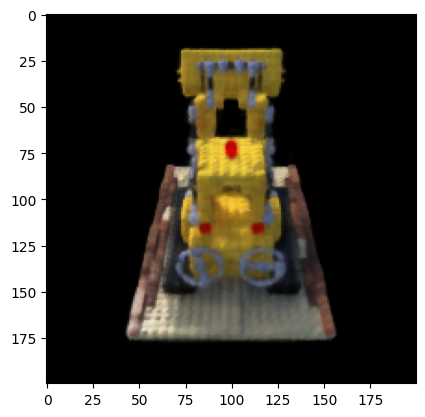

In [52]:
plt.imshow(new_images[0].cpu())

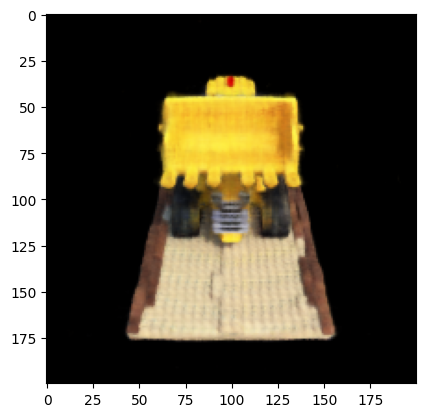

In [53]:
plt.imshow(new_images[30].cpu())

In [54]:
from PIL import Image
import torchvision
import torchvision.transforms as T

out_dir = proj_dir + '/out_dir/'
test_scenes_dir = out_dir + 'final_scenes/'
os.makedirs(out_dir, exist_ok=True)
os.makedirs(test_scenes_dir, exist_ok=True)

trans = lambda x: T.ToPILImage()(x.cpu().moveaxis(-1,0))

def save_img(fname, img_out, out_dir=out_dir):
    if '.jpg' not in fname:
        fname = fname + '.jpg'
    full_name = out_dir + '/' + fname
    im = trans(img_out)
    im.save(full_name)

### Create GIF
def create_gif(in_dir, out_dir=out_dir, out_name='final_out.gif', num_img=60, duration=40):
    im1 = Image.open(in_dir + 'img_0.jpg')
    extra_images = []
    for i in range(1, num_img):
        img_name = in_dir + 'img_' + str(i) + '.jpg'
        extra_images.append(Image.open(img_name))
    im1.save(out_dir + out_name, save_all=True, append_images=extra_images, duration=duration, loop=0)

In [55]:
for i, img in enumerate(new_images):
    save_img('img_' + str(i), img, out_dir=test_scenes_dir)

In [56]:
create_gif(in_dir=test_scenes_dir, duration=70)